In [1]:
library(survminer)
library(survival)
library(forestplot)
library(ggsci)
library(mice)

Loading required package: ggplot2

Loading required package: ggpubr


Attaching package: ‘survival’


The following object is masked from ‘package:survminer’:

    myeloma


Loading required package: grid

Loading required package: checkmate

Warning message:
“package ‘checkmate’ was built under R version 4.3.2”
Loading required package: abind


Attaching package: ‘mice’


The following object is masked from ‘package:stats’:

    filter


The following objects are masked from ‘package:base’:

    cbind, rbind




In [2]:
data.df <- read.table("data/processed/AL_for_imputation_01.tsv", sep="\t", header=T)
rownames(data.df) <- data.df$Code.ID
data.df$Code.ID <- NULL

In [ ]:
# Imputation with multivariable imputation by chained equations (MICE)
imp <- mice(data = data.df, m = 5, maxit = 100, seed = 500)

In [ ]:
saveRDS(imp, file = "data/imputed/dataset_mice_01.rds") 

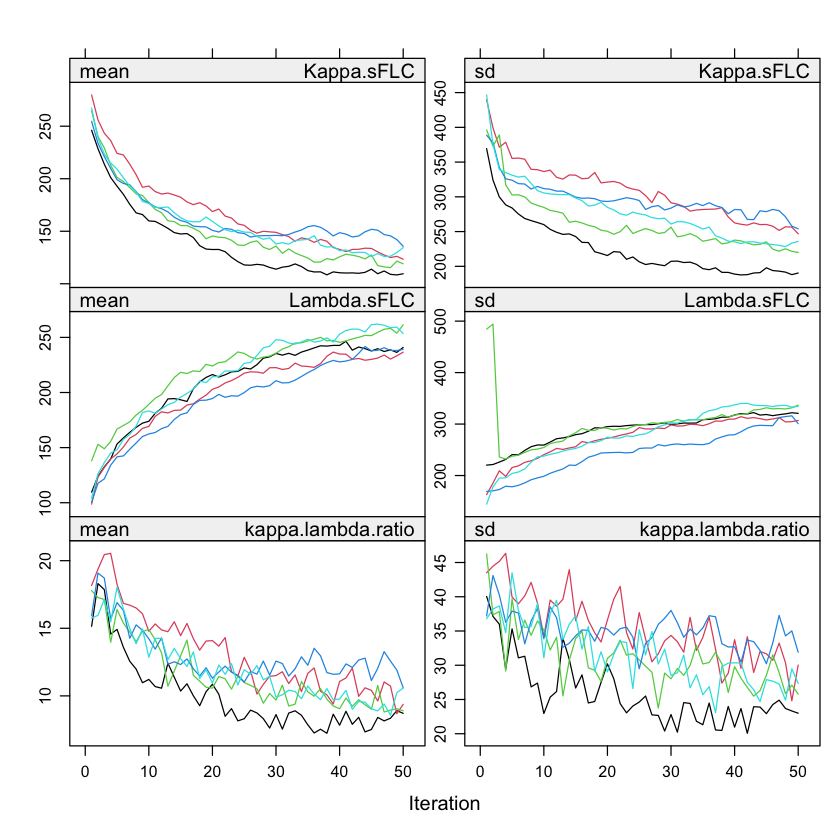

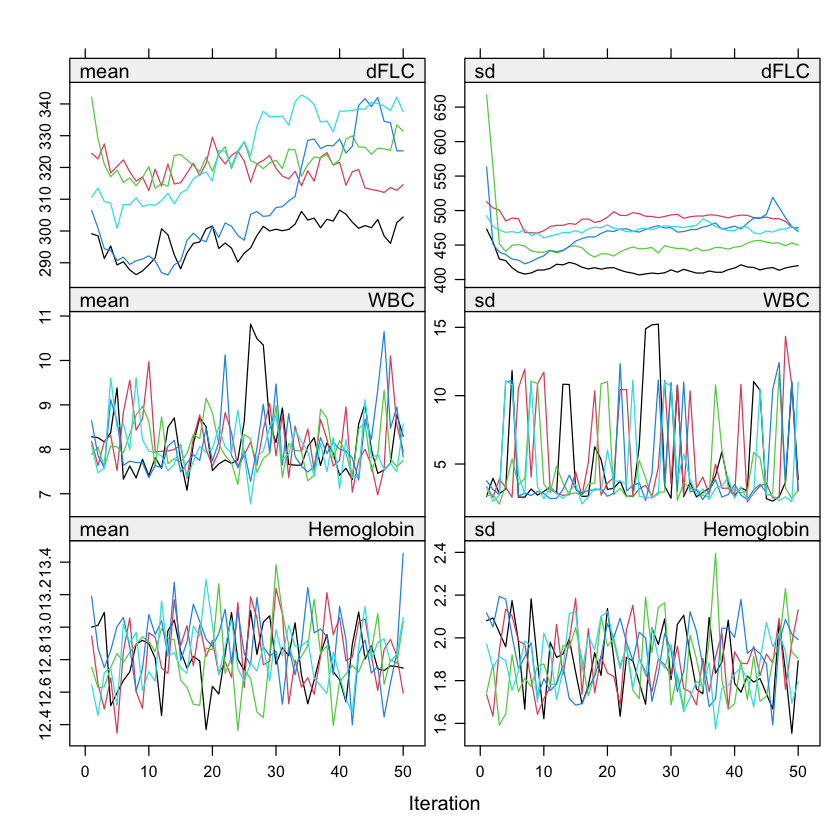

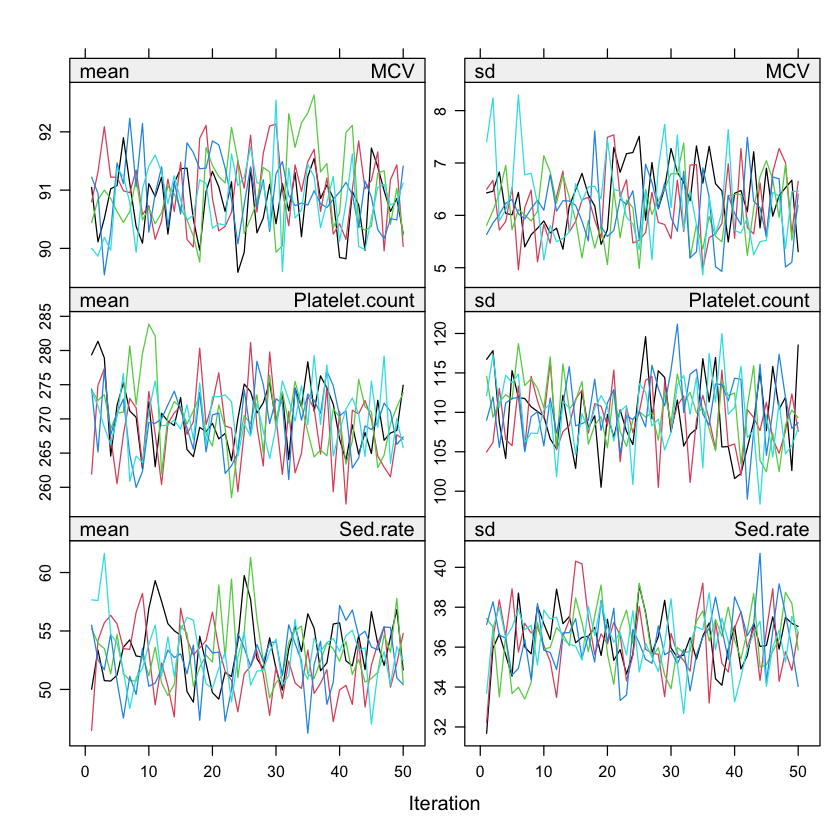

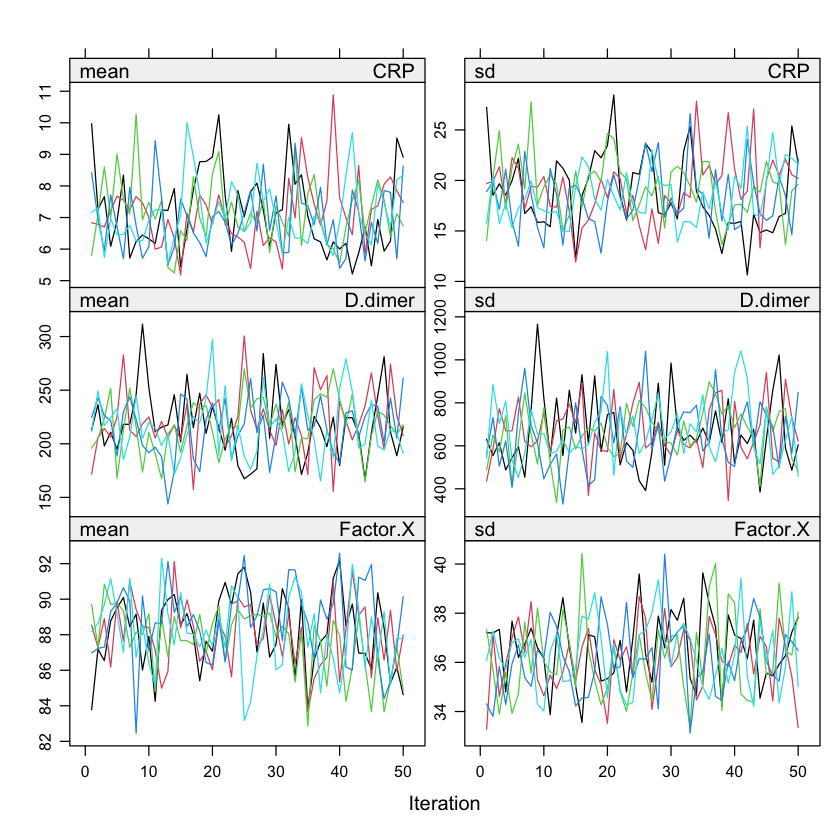

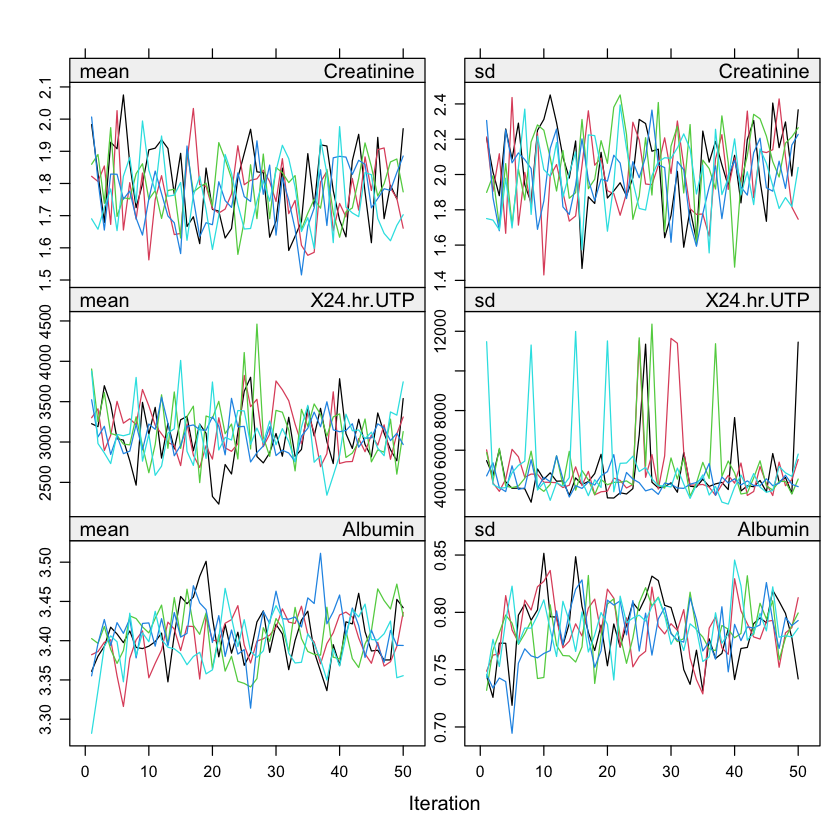

...

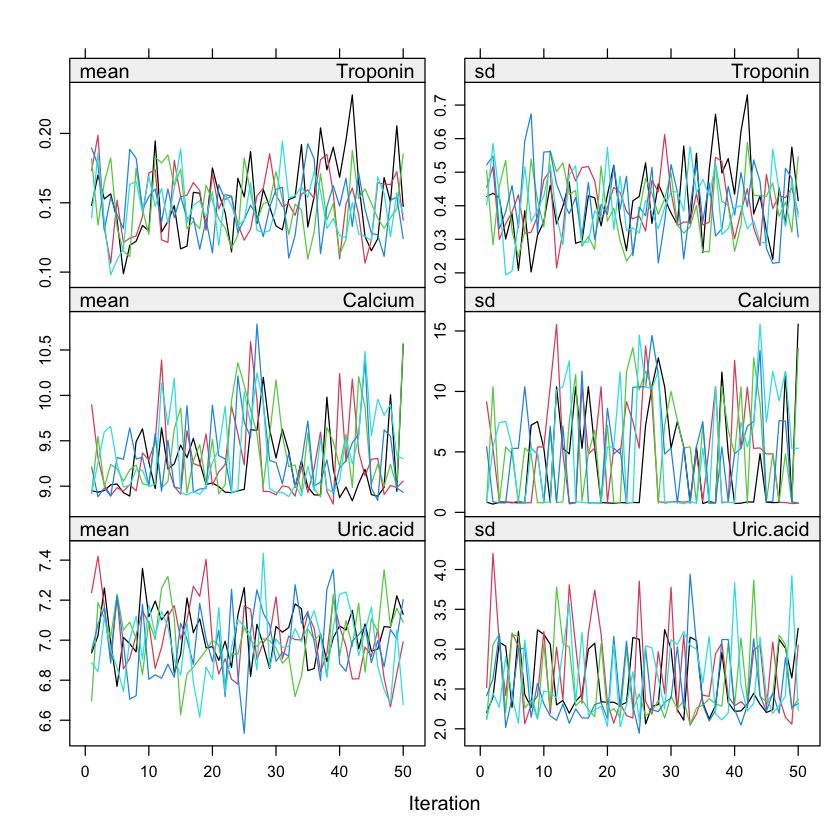

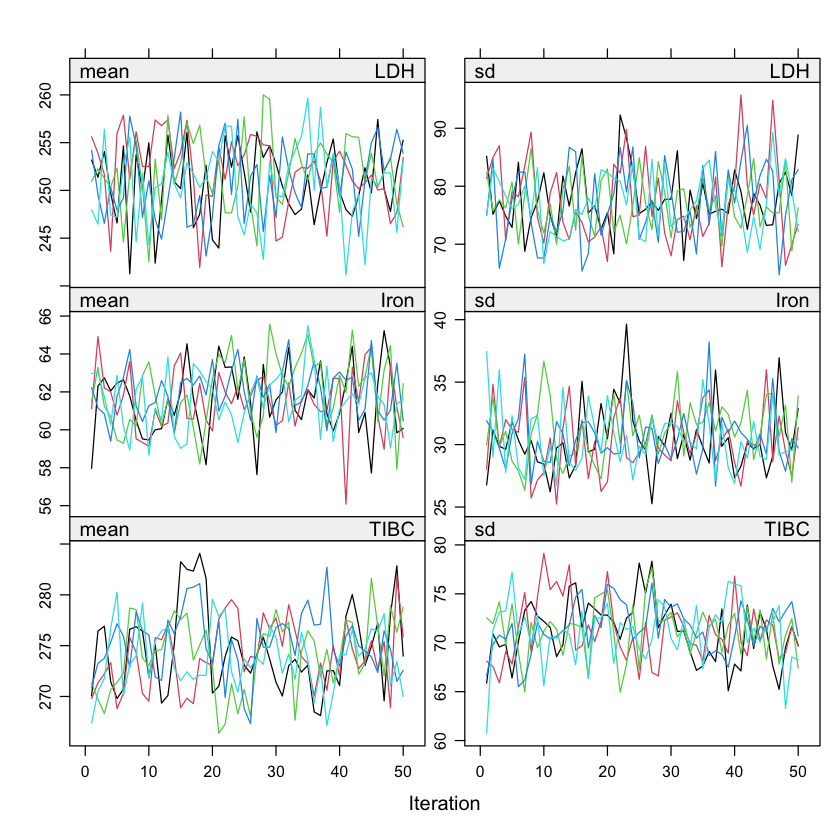

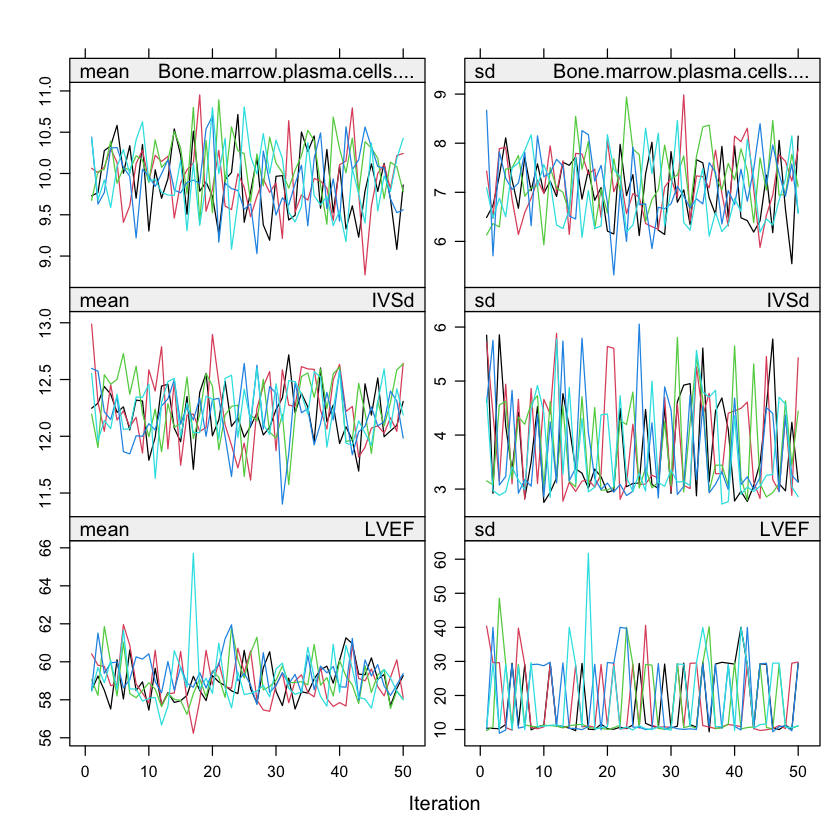

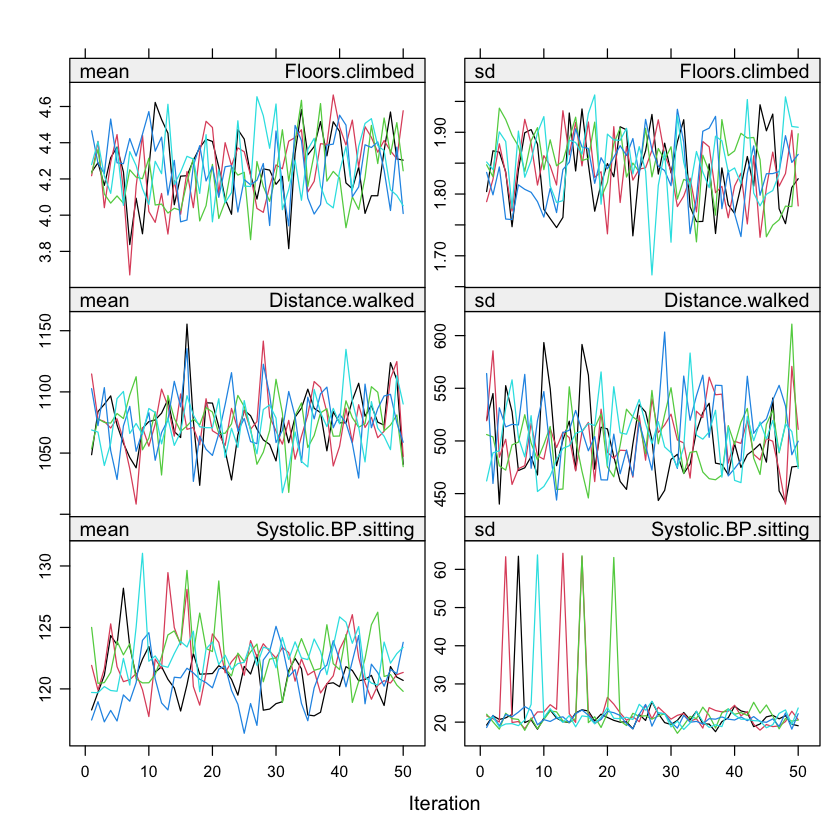

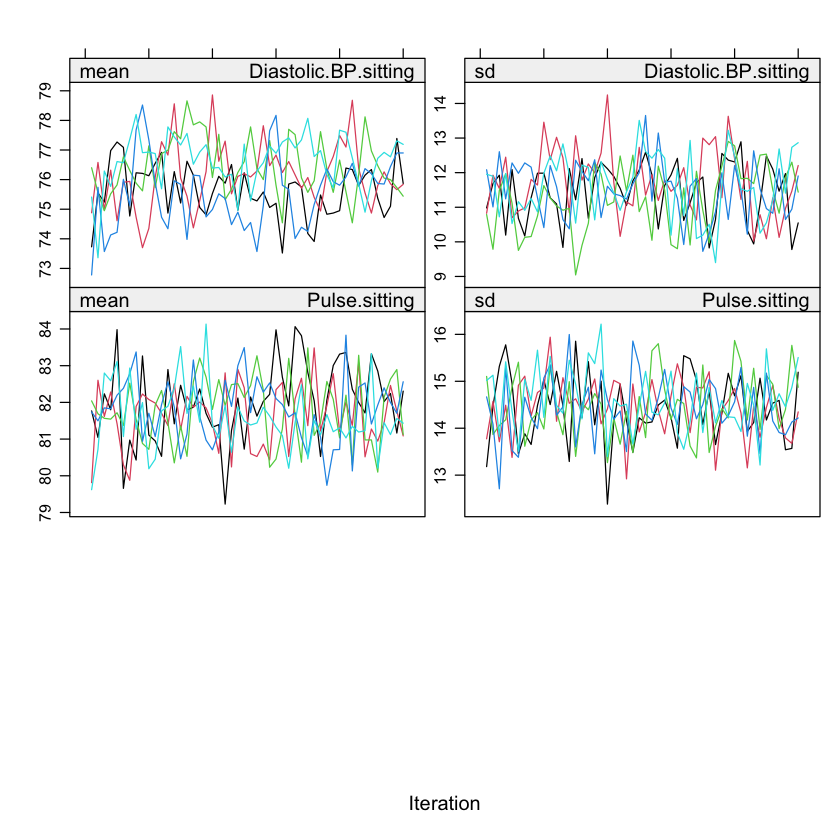

In [38]:
plot(imp)

In [42]:
X <- complete(imp,1)
rownames(X) <- rownames(data.df)

In [44]:
imp$imp

1,2,3,4,5
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,2,3,4,5
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,2,3,4,5
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,2,3,4,5
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,2,3,4,5
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
1,2,3,4,5


In [47]:
complete(imp,1)$dFLC

[1]    53.0     6.8   610.8    19.1   815.6    23.6   167.0   137.6     7.7
  [10]    78.4    31.8   171.7    -1.0   544.5    73.3  1324.6     4.2   328.7
  [19]   119.9   737.1    77.6    46.4   135.7    31.6  1021.4   -23.0    -2.3
  [28]   268.7    16.4    55.3    63.0  1438.6   371.0   840.7  1033.2   368.6
  [37]    63.7   586.7    57.0   131.7   293.7    39.8    37.0   -15.5    49.8
  [46]    63.1     3.3  1472.3     3.2   265.0    11.4   306.5   949.1    29.9
  [55]    26.0   488.7    82.4   610.8   358.2   234.3  1324.6   479.1   106.5
  [64]   345.4    42.9   165.5    -3.2    -2.0   168.3   241.4   100.9    11.3
  [73]   306.9    -0.2    95.2   212.0   152.6   259.1    97.1    11.8   442.1
  [82]    59.8    16.7    46.4   625.2   393.8   314.6   544.5    11.0    59.2
  [91]    12.7    99.0   259.1    20.4    73.3   364.8  2799.2   429.8   478.4
 [100]   248.4  1388.6   906.9    43.3   101.2   118.0    30.3   887.6  1365.7
 [109]    53.1   196.3   406.6    -8.4   386.7     8.7  2767.7   511.4    24.2
 [118]   506.0    18.9   269.5   137.7    10.4   356.7    66.4   525.5   244.2
 [127]   876.8   355.7   177.1   229.7   207.8    98.2    73.3  1042.1   407.8
 [136]   540.5   133.7   358.8   529.6   132.0    53.0     8.3   449.6    17.7
 [145]    12.1   308.4   135.7     6.6   478.8   162.9   385.4    60.9   109.5
 [154]   126.2   125.3    10.2     5.2   372.0   336.0   386.2    42.5    30.8
 [163]   248.4    59.8   147.6   -28.0   478.2   142.8   619.6   712.9   152.6
 [172]    30.6   512.7   335.6    96.8   125.5     8.2    -0.6   122.4    72.0
 [181]   610.8   247.6    36.2   340.1   479.1    50.8   407.8   269.5   432.2
 [190]    88.2  3216.3   308.4   275.6   131.7   106.5     6.2   297.0   106.2
 [199]    17.3   718.6   453.3    41.9   867.9   101.2   137.8    14.5    39.2
 [208]   169.0   136.6    70.2   253.8    59.5    97.9   145.1   762.0    59.5
 [217]   815.6   194.3    49.7    48.8   122.4     8.6    28.5   229.0   136.6
 [226]    73.9   222.5   113.9   206.2   436.2    21.3    86.6    28.3   139.0
 [235]   431.1    13.3    20.0   541.9    40.9     7.1   107.5   162.3   284.7
 [244]  1330.5   431.4   191.8   480.8    20.0   124.3    63.7    41.9    43.3
 [253]   207.3   184.7   846.5   124.3    49.8   267.1   134.6   194.4   209.4
 [262]   963.1    92.0    58.3   222.9     7.6    74.3  2385.4    96.7    40.7
 [271]   310.8   568.0    77.6   324.9    46.3   212.7    70.2    32.2   963.1
 [280]   163.7   340.1   423.8   139.0   135.3    -4.8   979.5    22.0   792.9
 [289]    41.2   114.6    11.9   255.1   260.2   442.1     2.0    60.9   143.9
 [298]   924.6    39.9   172.6  1021.4   118.0   141.5   253.8   219.5   737.1
 [307]    52.5   277.8   128.2   -21.9  1713.8   163.7   840.7    -1.0    96.7
 [316]   137.7   382.5   126.2    64.7    61.0    -1.0    58.3   453.3    -1.0
 [325]     2.6   183.9    32.6   197.2   276.9    57.0    73.3    78.1   460.6
 [334]   481.8    60.9    10.3   598.2    26.0   262.7    65.0   450.0  1562.7
 [343]   256.5   450.0    27.0  1472.3   223.2    63.0   306.9     6.1   846.5
 [352]   522.6   160.5   492.8    34.2    64.7   137.8    29.4   611.4  1383.4
 [361]   138.4     0.5   449.2   262.7    95.0   383.5   510.0   748.8    55.0
 [370]   364.1     6.1   544.5    59.7    13.3   649.6   265.0  -327.0   311.3
 [379]   999.7   157.4   216.2    60.1    75.4   -10.6   527.3   -10.5   508.0
 [388]    15.4    60.6   122.4    29.6    53.8     1.7    54.8    56.7    47.2
 [397]   128.4   522.6    30.1     6.9    63.0    78.4   196.3  1709.5    48.1
 [406]   100.2   492.8   311.0   243.0   150.4   284.5   906.9   141.7   142.8
 [415]    97.1  1551.9   256.4    44.6    11.8    94.0    17.7   527.3    12.7
 [424]    12.9  2442.0    17.0   128.3   286.5   478.4     4.6   156.6    51.5
 [433]   101.2    33.0    48.8    27.1   116.4   222.6    11.4    23.8    -7.2
 [442]    40.4    87.0   253.8    82.0    12.1    30.8    46.8   450.1   139.6
 [451]    14.8    87.9    41.5    77.5   119.9    17.

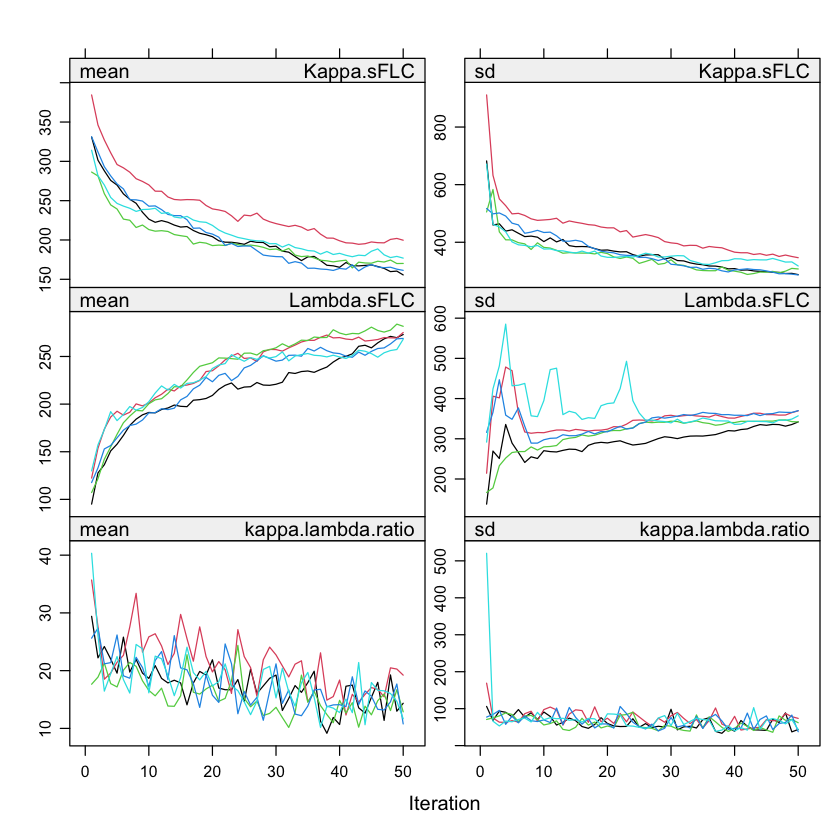

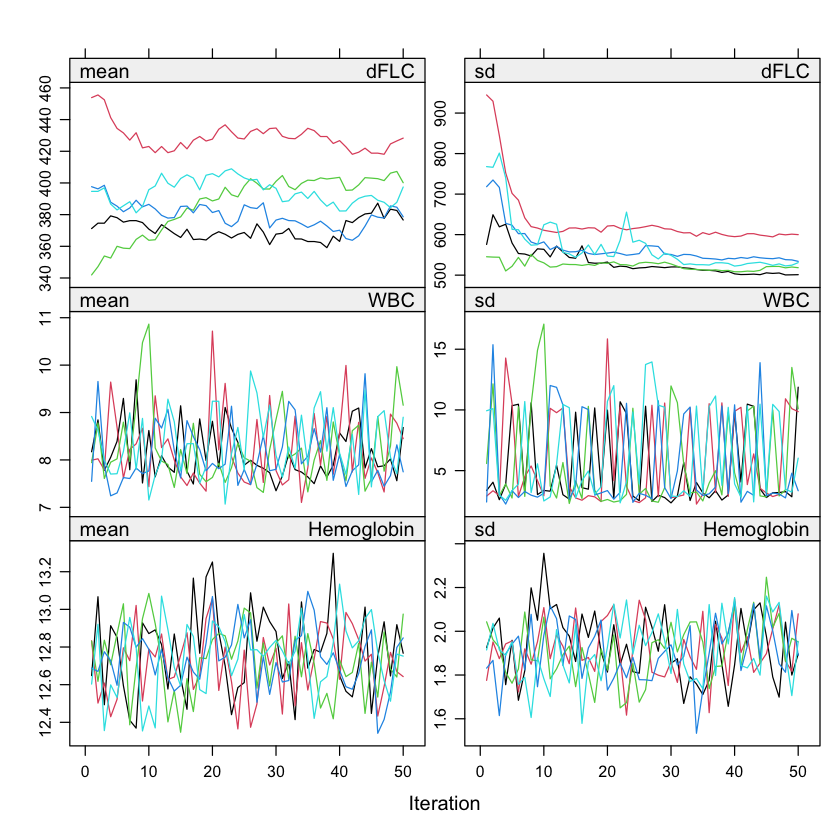

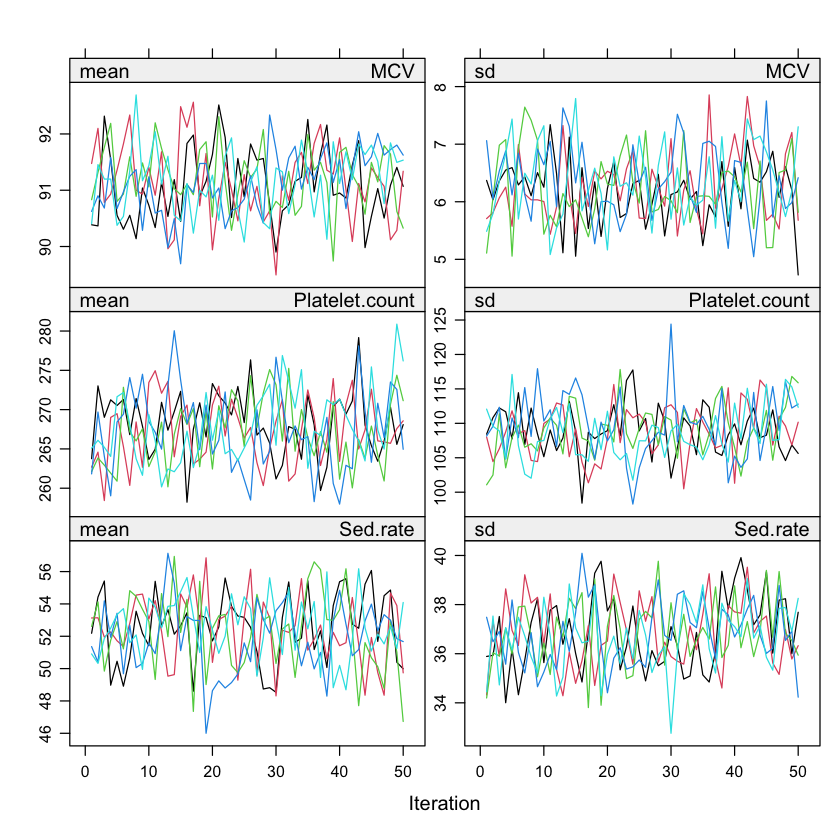

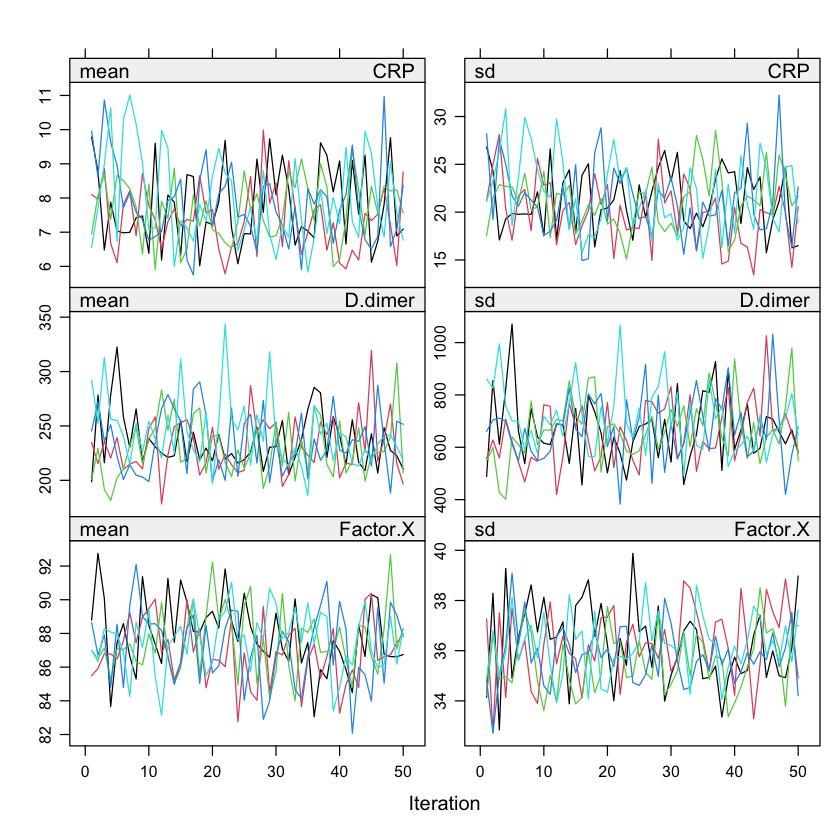

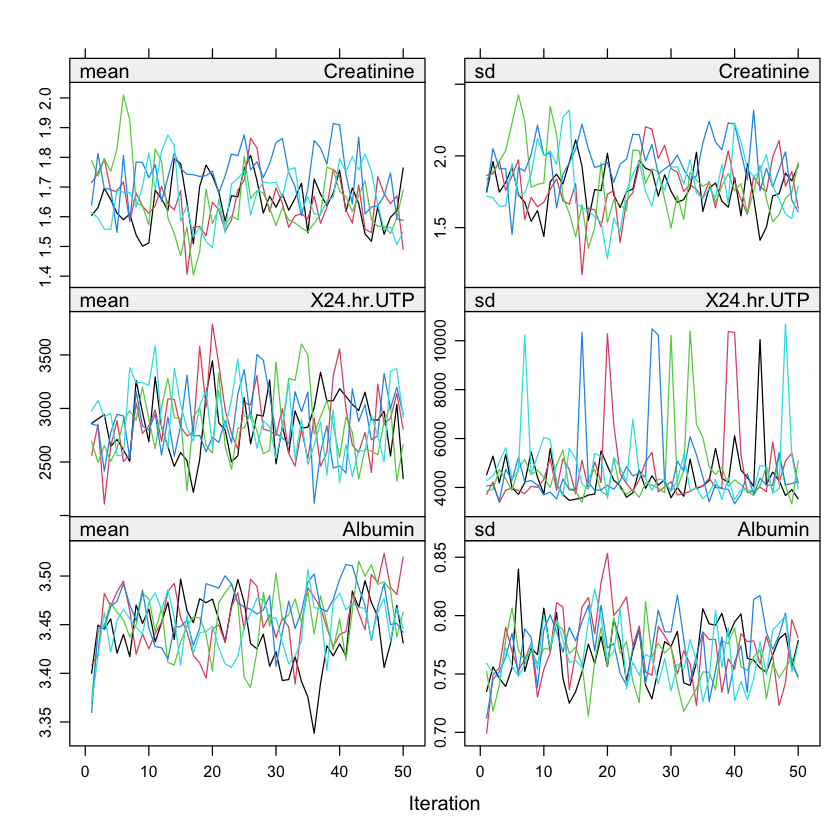

...

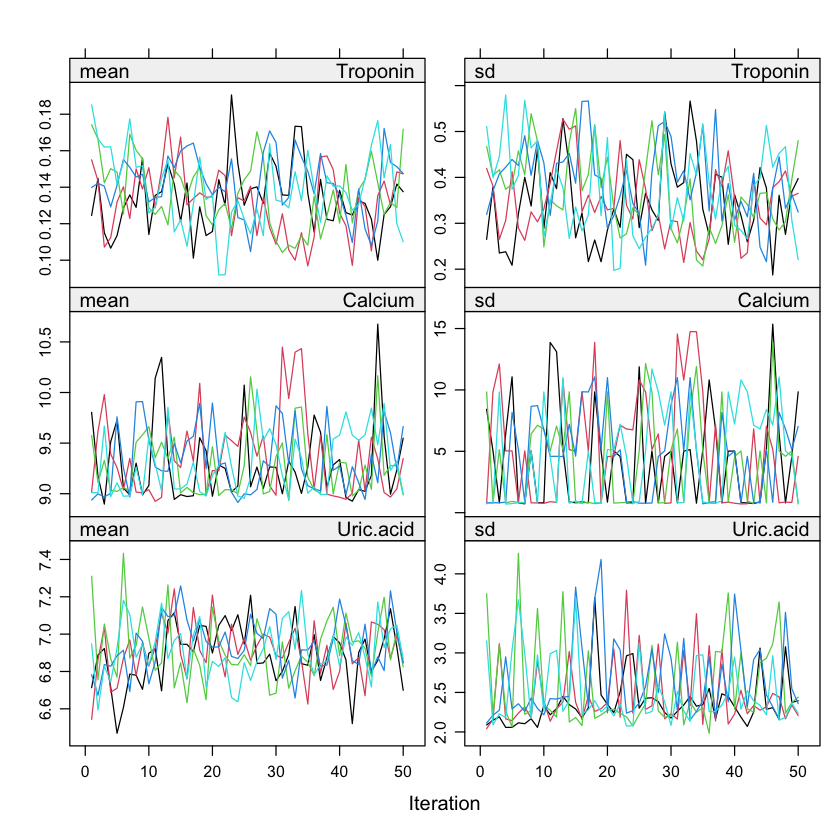

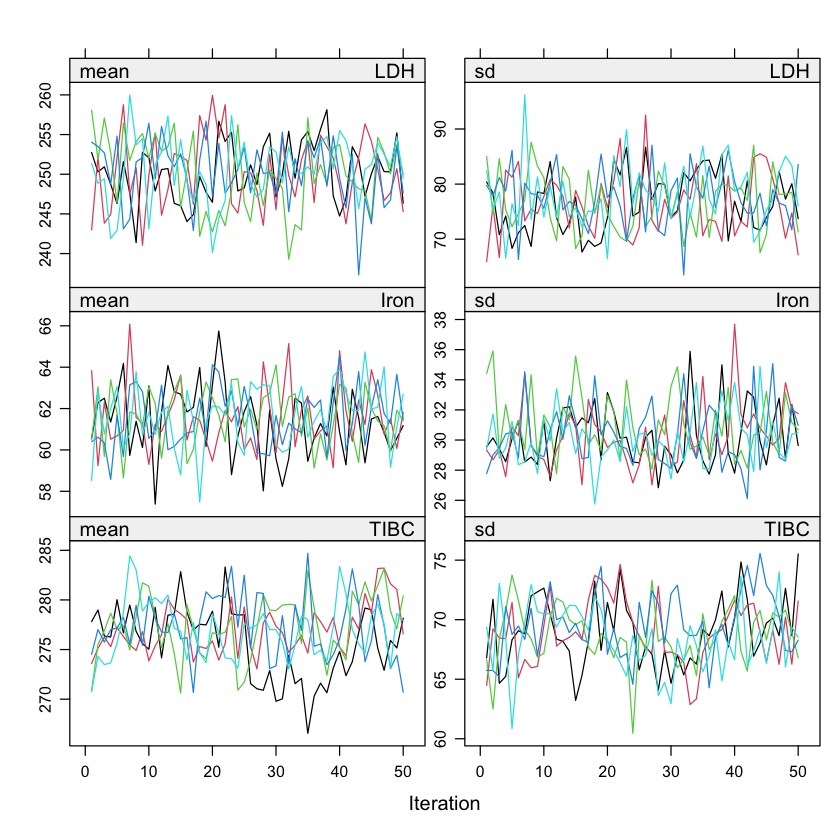

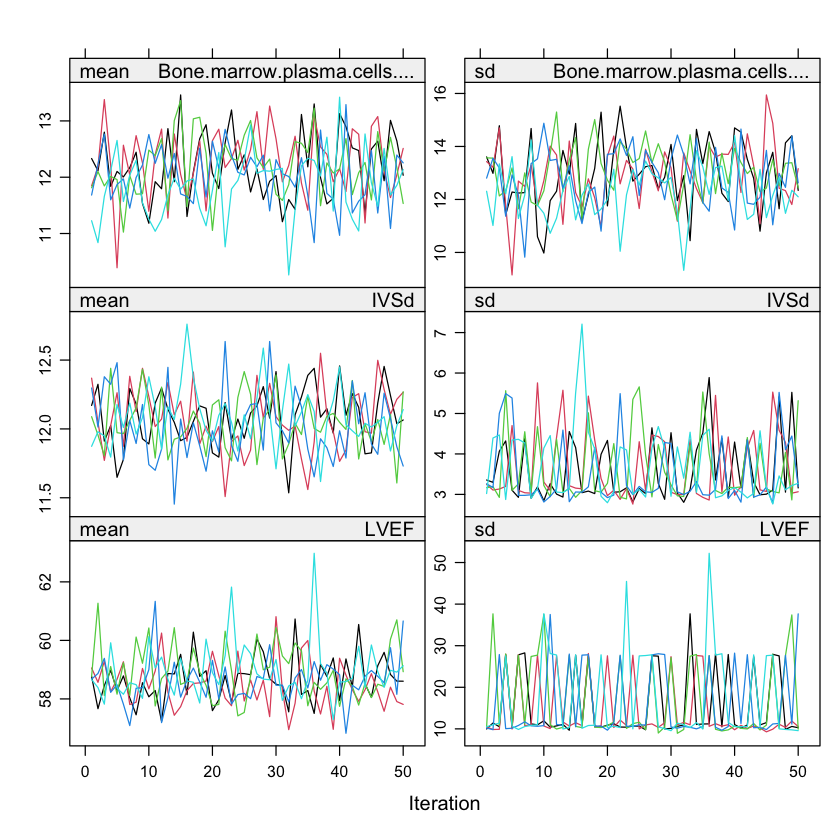

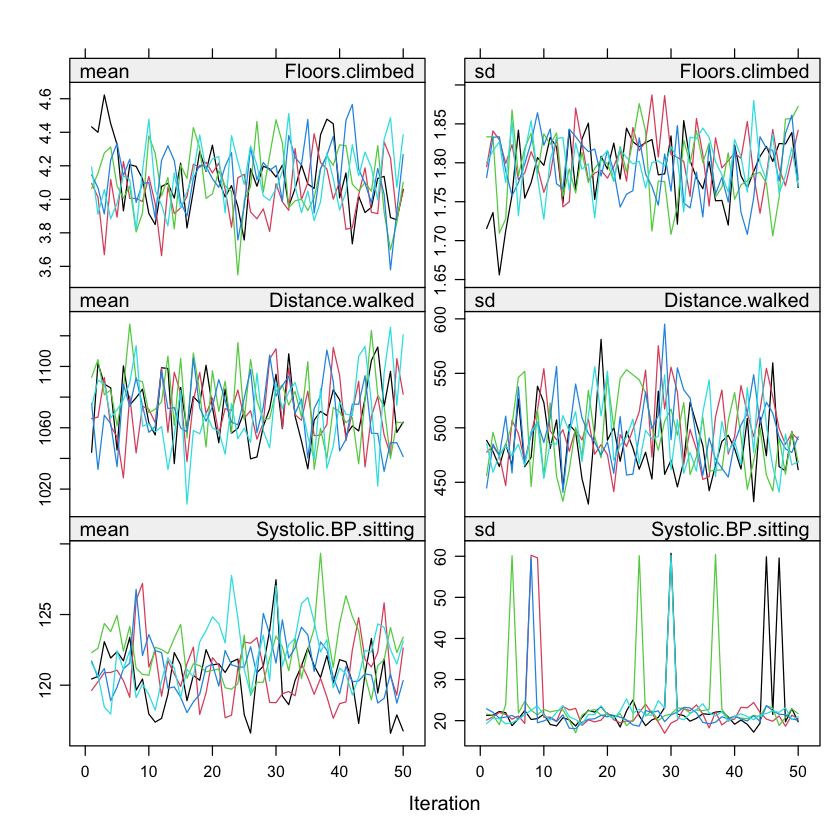

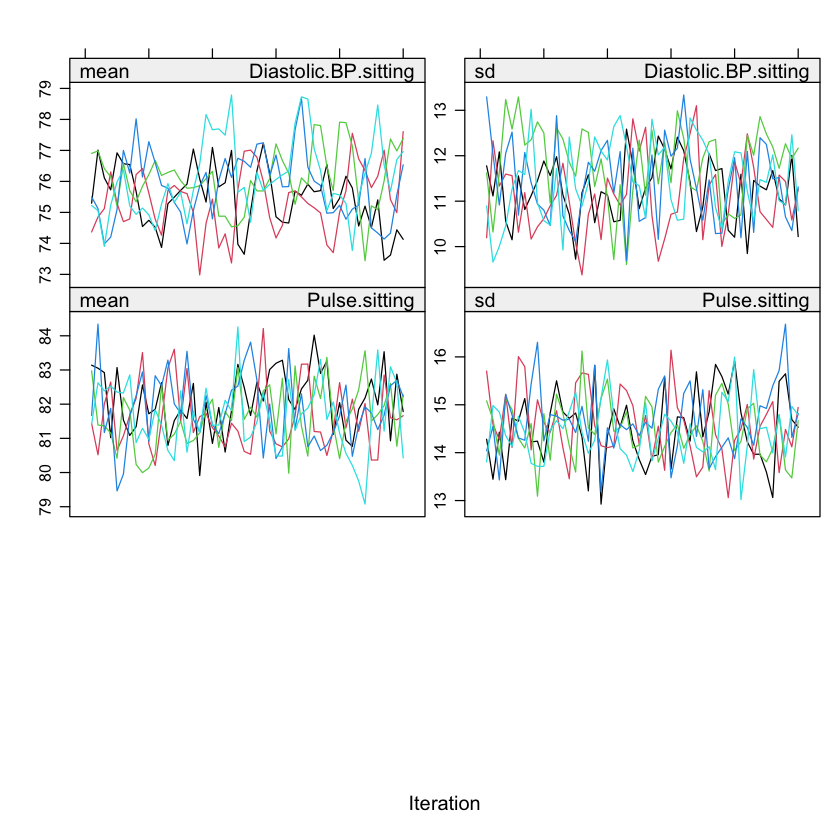

In [18]:
imp <- mice(data.df, print = FALSE)
imp$predictorMatrix

Warning message:
“Number of logged events: 39”


,Amyloid.type,Age,Sex,Ethnicity,Race,Education,Kappa.or.lambda.PCD,Kappa.sFLC,Lambda.sFLC,kappa.lambda.ratio,⋯,Iron,TIBC,Bone.marrow.plasma.cells....,IVSd,LVEF,Floors.climbed,Distance.walked,Systolic.BP.sitting,Diastolic.BP.sitting,Pulse.sitting
Amyloid.type,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Age,0,0,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Sex,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Ethnicity,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Race,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Education,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Kappa.or.lambda.PCD,0,1,0,0,0,0,0,1,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Kappa.sFLC,0,1,0,0,0,0,0,0,1,1,⋯,1,1,1,1,1,1,1,1,1,1
Lambda.sFLC,0,1,0,0,0,0,0,1,0,1,⋯,1,1,1,1,1,1,1,1,1,1
kappa.lambda.ratio,0,1,0,0,0,0,0,1,1,0,⋯,1,1,1,1,1,1,1,1,1,1
